# Investigate Yamazaki-based initial conditions from first run

In [1]:
import numpy as np

from dask.distributed import Client

import xarray as xr

import matplotlib.pyplot as plt
import cmocean.cm as cmocean
import gsw
from matplotlib.colors import ListedColormap

import intake
cat = intake.cat.access_nri

In [2]:
client = Client(threads_per_worker = 1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 28
Total threads: 28,Total memory: 125.19 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:34611,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:39621,Total threads: 1
Dashboard: /proxy/42271/status,Memory: 4.47 GiB
Nanny: tcp://127.0.0.1:36463,


## Bathymetry in this region for reference:

In [3]:
# import topography for masking:

# ice shelf cavity topography:
topog_path = '/g/data/vk83/prerelease/configurations/inputs/access-om3/panan-isf.4km/2026.01.08/topog.nc'
topog = xr.open_dataset(topog_path)

land_mask = topog.depth.where(topog.depth==0)

# sea ice topography:
topog_seaice_path = '/g/data/vk83/prerelease/configurations/inputs/access-om3/panan-isf.4km/2026.01.08/topog_seaice.nc'
topog_seaice = xr.open_dataset(topog_seaice_path)

(-76.0, -68.0)

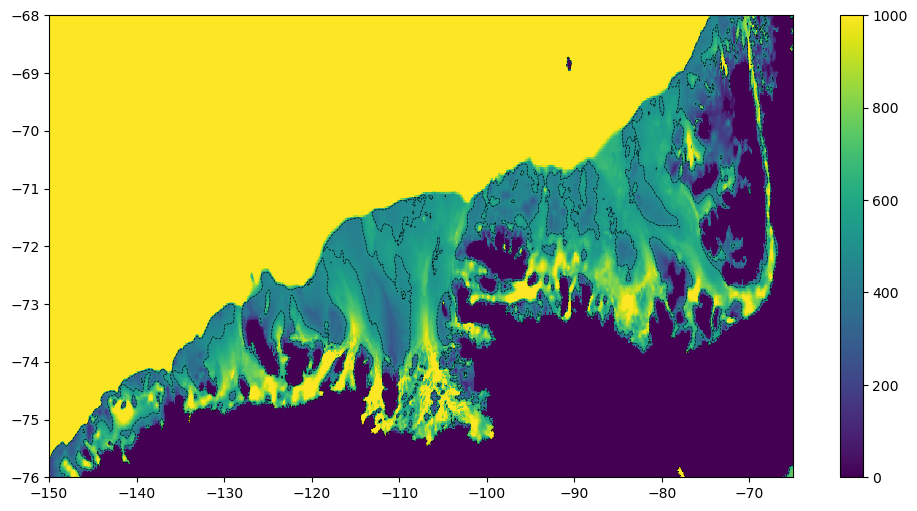

In [4]:
# plot bathymetry in this region:

plt.figure(figsize=(12,6))
plt.pcolormesh(topog.lon, topog.lat, topog.depth,vmin=0,vmax=1000)
plt.colorbar()

plt.contour(topog.lon, topog.lat, topog.depth, levels=[500], colors='k',linewidths=0.5,linestyles='--')

plt.xlim(-150,-65)
plt.ylim(-76,-68)

## Plot existing initial conditions:

In [5]:
# import initial conditions:
IC_path = '/g/data/vk83/prerelease/configurations/inputs/access-om3/panan-isf.4km/2026.01.08/ocean_temp_salt.res.nc'
IC = xr.open_dataset(IC_path)

(-76.0, -68.0)

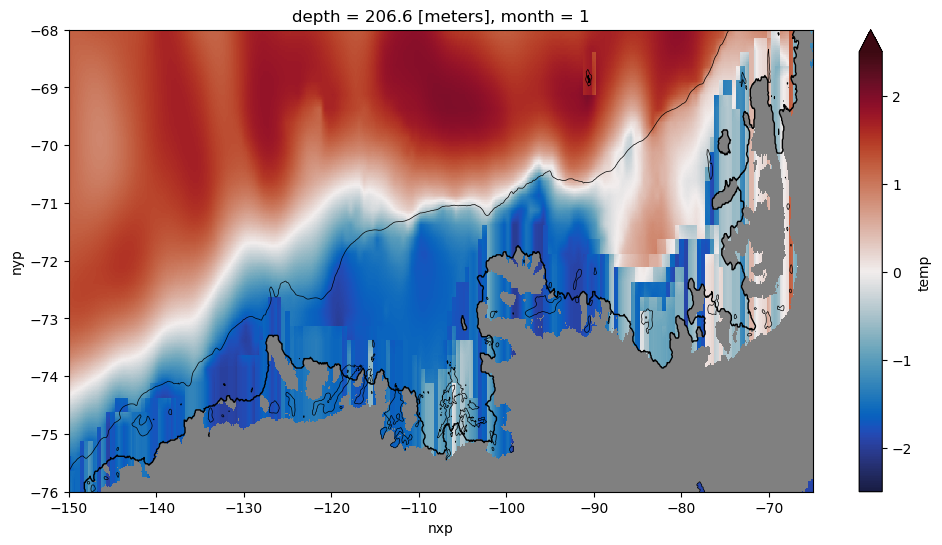

In [6]:
# plot potential temperature at 200m for existing initial conditions:

plt.figure(figsize=(12,6))
IC.temp.sel(depth=200,method='nearest').plot(x='nxp', y='nyp', vmin=-2.5, vmax=2.5, cmap=cmocean.balance)

plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
#plt.contour(topog.lon, topog.lat, topog.depth, levels=[500], colors='k',linewidths=0.5)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5)

solid_grey_cmap = ListedColormap(['grey']) 
plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

plt.xlim(-150,-65)
plt.ylim(-76,-68)

(-76.0, -68.0)

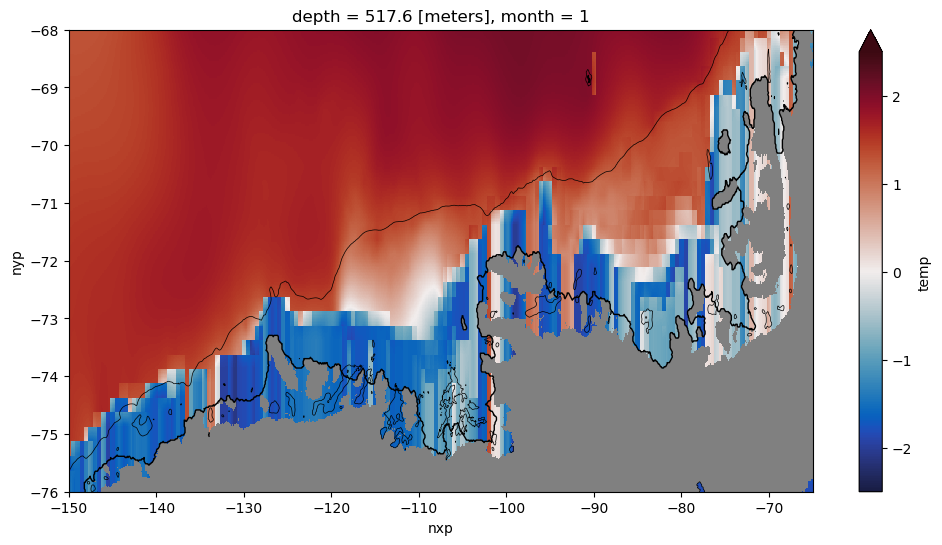

In [7]:
# plot potential temperature at 500m for existing initial conditions:

plt.figure(figsize=(12,6))
IC.temp.sel(depth=500,method='nearest').plot(x='nxp', y='nyp', vmin=-2.5, vmax=2.5, cmap=cmocean.balance)

plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5)

plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

plt.xlim(-150,-65)
plt.ylim(-76,-68)

(-76.0, -68.0)

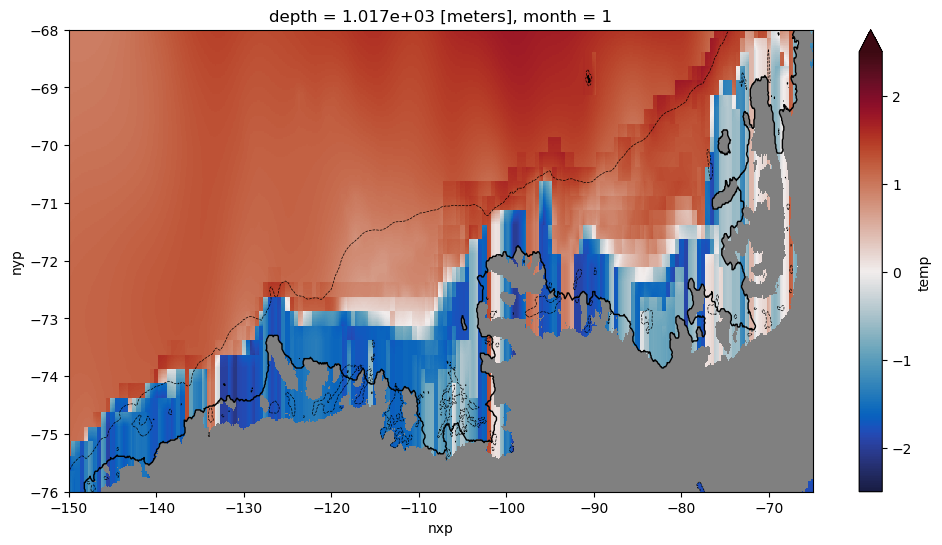

In [8]:
# plot potential temperature at 1000m for existing initial conditions:

plt.figure(figsize=(12,6))

IC.temp.sel(depth=1000,method='nearest').plot(x='nxp', y='nyp', vmin=-2.5, vmax=2.5, cmap=cmocean.balance)

plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5,linestyles='--')

plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

plt.xlim(-150,-65)
plt.ylim(-76,-68)

## Obs for comparison (note no temperature conversions done):

### Pine Island Glacier ice front obs (Christianson et al. 2016):

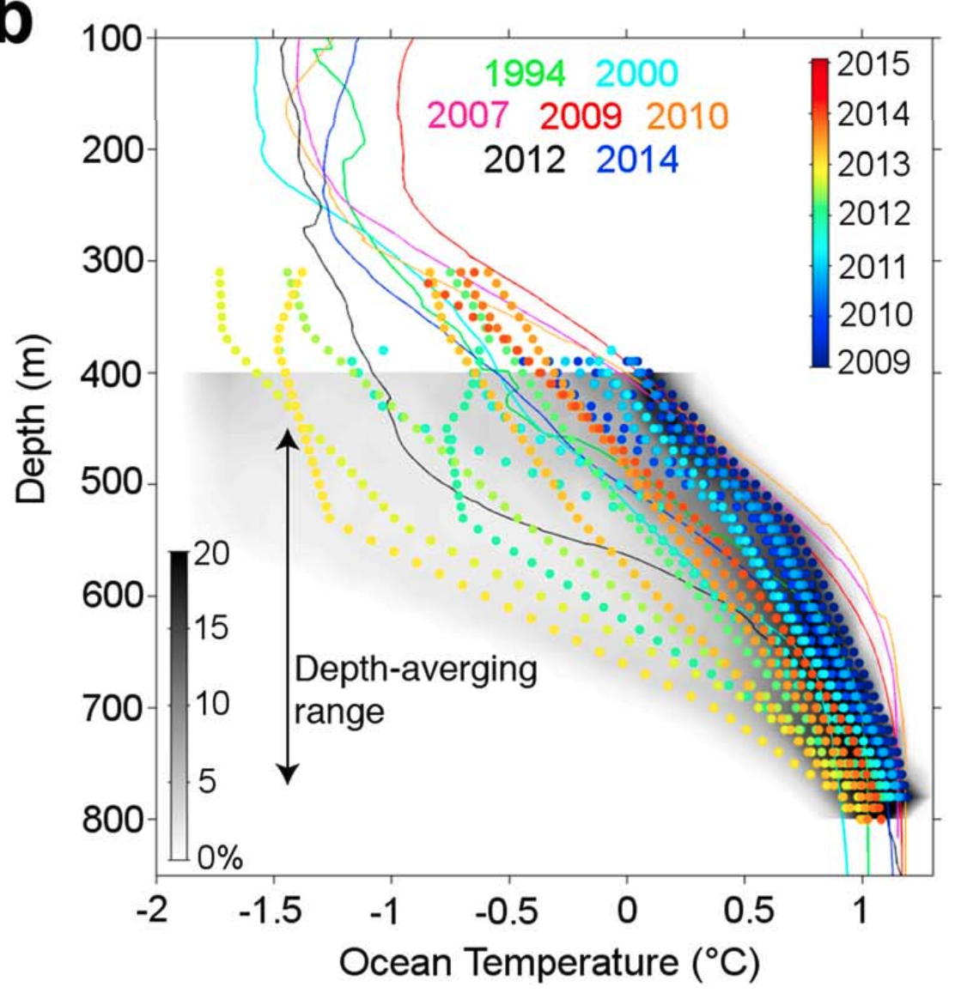


### Dotson Ice Front obs (Jenkins et al. 2018):

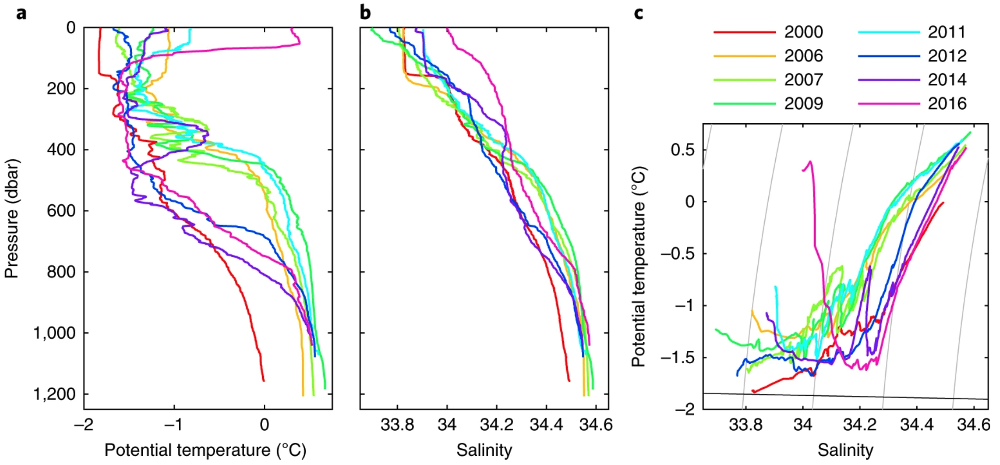

### sub-Thwaites Eastern Ice Shelf obs (Dotto et al. 2022):

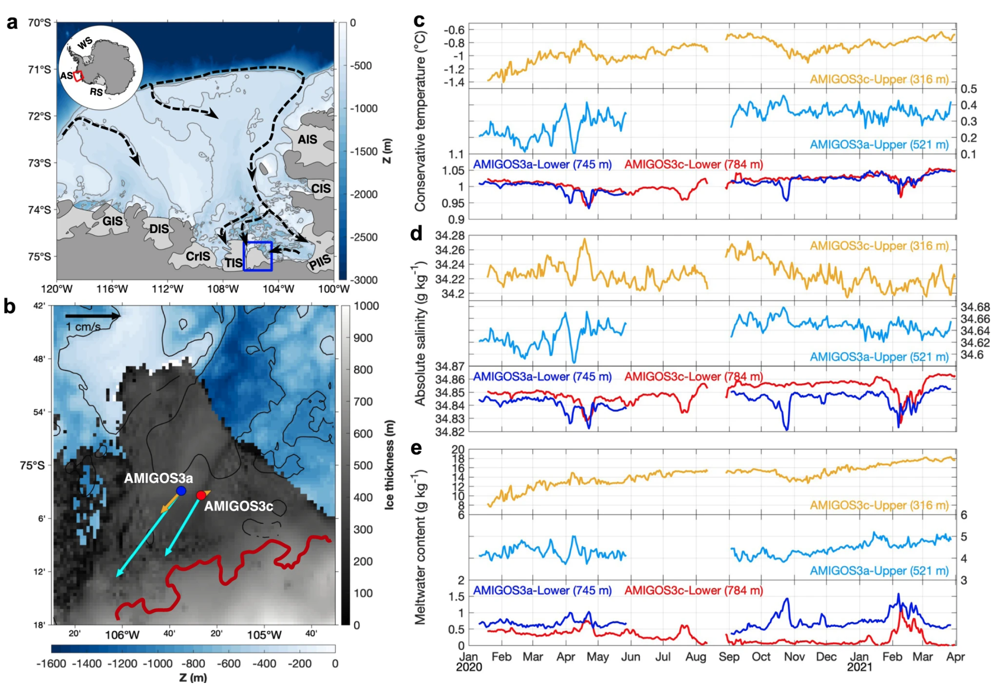


## Check Kaihe's climatology in this region:

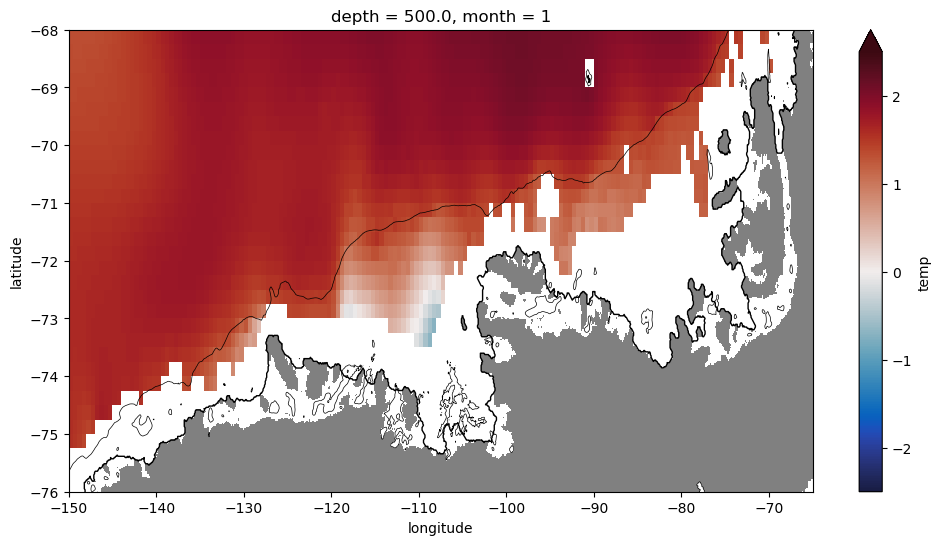

In [9]:
# Kaihe's climatology:

kaihe_path = '/g/data/x77/cy8964/Yamazaki_obs/Yamazaki_SO-Monthly-Climatology_v20240604.nc'
kaihe_data = xr.open_dataset(kaihe_path)
kaihe_temp = kaihe_data.temp.isel(month=0)

plt.figure(figsize=(12,6))
kaihe_temp.sel(depth=500,method='nearest').plot(vmin=-2.5, vmax=2.5, cmap=cmocean.balance)
plt.xlim(-150,-65)
plt.ylim(-76,-68)

# plot model land/isobath etc:
plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5)
plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

These temperatures at 500m are actually not so cold. But our initial condition extrapolation algorithm uses bfill and ffill on depth FIRST, before lat/lon. I think we should change the order of this. Otherwise cold coastal surface temperatures are filled down to the bottom of cavities/ice fronts.

This is the code that was used (from https://github.com/claireyung/mom6-panAn-iceshelf-tools/blob/claire_working/initial-conditions/Yamazaki_IC_into_8km_grid-Copy1.ipynb):

## Check Shenjie's climatology in this region:

In [10]:
shenjie_path = '/g/data/x77/cy8964/ocean-ice-obs/OI_Climatology.nc'
shenjie_data = xr.open_dataset(shenjie_path)

# has no coords:
shenjie_data = shenjie_data.set_coords(["pressure","longitude","latitude"])

# remove scalars on coords:
shenjie_data["latitude"] = shenjie_data.latitude.isel(SCALAR=0)
shenjie_data["longitude"] = shenjie_data.longitude.isel(SCALAR=0)
shenjie_data["pressure"] = shenjie_data.pressure.isel(SCALAR=0)

# set indices:
shenjie_data = shenjie_data.set_index(nz="pressure")
shenjie_data = shenjie_data.set_index(nx="longitude")
shenjie_data = shenjie_data.set_index(ny="latitude")

# swap lat/lon:
shenjie_data = shenjie_data.transpose("nz","ny","nx")
#shenjie_data

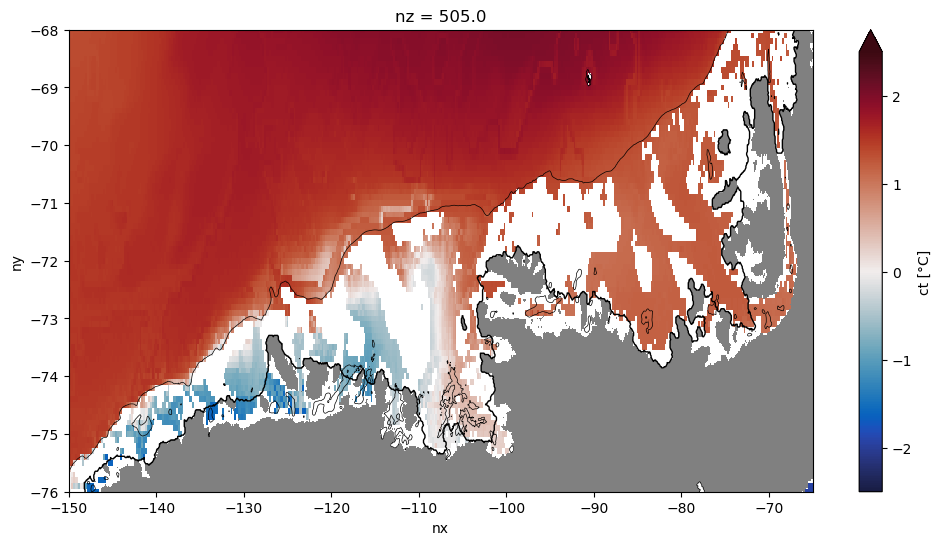

In [11]:
shenjie_temp = shenjie_data.ct

plt.figure(figsize=(12,6))
shenjie_temp.sel(nz=500,method='nearest').plot(vmin=-2.5, vmax=2.5, cmap=cmocean.balance)
plt.xlim(-150,-65)
plt.ylim(-76,-68)

# plot model land/isobath etc:
plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5)
plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

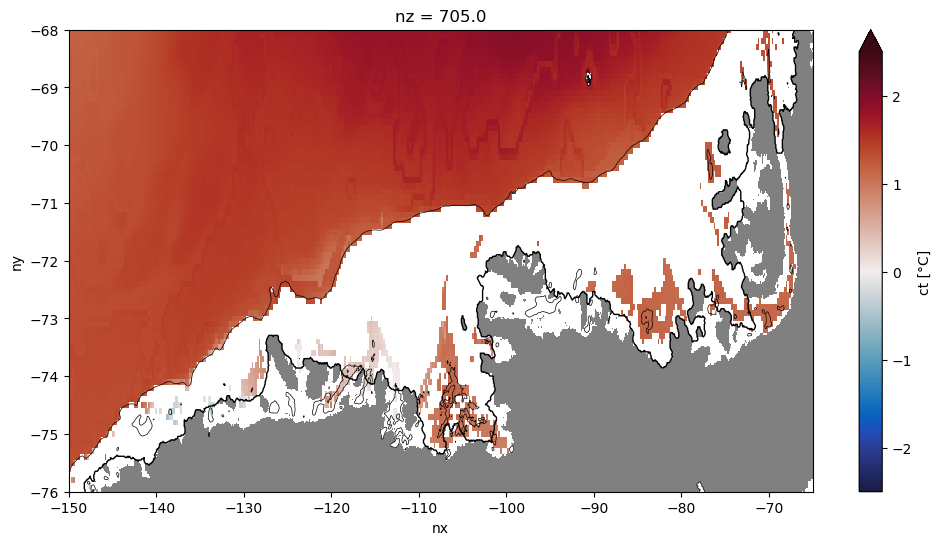

In [12]:
plt.figure(figsize=(12,6))
shenjie_temp.sel(nz=700,method='nearest').plot(vmin=-2.5, vmax=2.5, cmap=cmocean.balance)
plt.xlim(-150,-65)
plt.ylim(-76,-68)

# plot model land/isobath etc:
plt.contour(topog.lon, topog.lat, topog_seaice.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog.lon, topog.lat, topog.depth, levels=[1000], colors='k',linewidths=0.5)
plt.pcolormesh(topog.lon,topog.lat,land_mask,cmap=solid_grey_cmap)

In [13]:
# shift latitude of model topo and land mask to match Shenjie's data:

topog_wrapped = topog.roll(nx=-1200)
topog_seaice_wrapped = topog_seaice.roll(nx=-1200)
topog_wrapped['lon'] = topog_wrapped.lon.where(topog_wrapped.lon>-180, other=topog_wrapped.lon+360)
land_mask_wrapped = topog_wrapped.depth.where(topog_wrapped.depth==0)

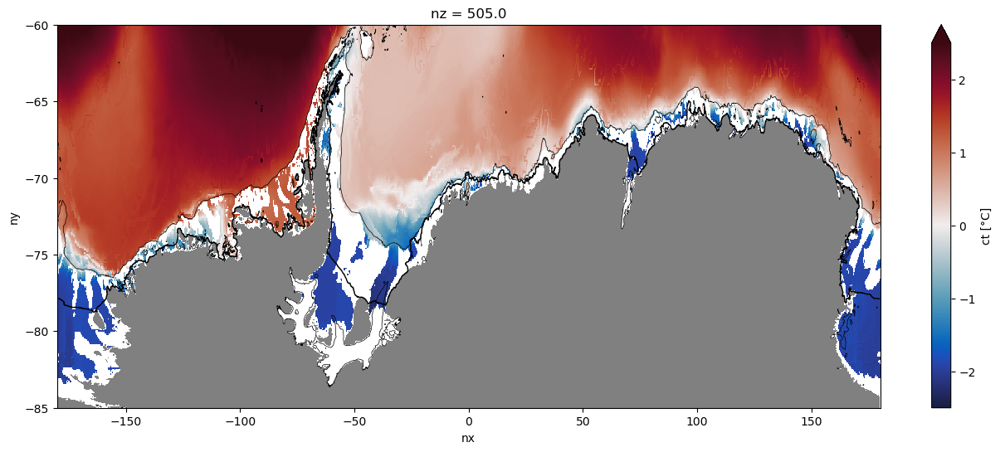

In [14]:
plt.figure(figsize=(16,6))
shenjie_temp.sel(nz=500,method='nearest').plot(vmin=-2.5, vmax=2.5, cmap=cmocean.balance)
plt.ylim(-85,-60)

# plot model land/isobath etc:
plt.contour(topog_wrapped.lon, topog_wrapped.lat, topog_seaice_wrapped.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog_wrapped.lon, topog_wrapped.lat, topog_wrapped.depth, levels=[1000], colors='k',linewidths=0.5)
plt.pcolormesh(topog_wrapped.lon,topog_wrapped.lat,land_mask_wrapped,cmap=solid_grey_cmap)

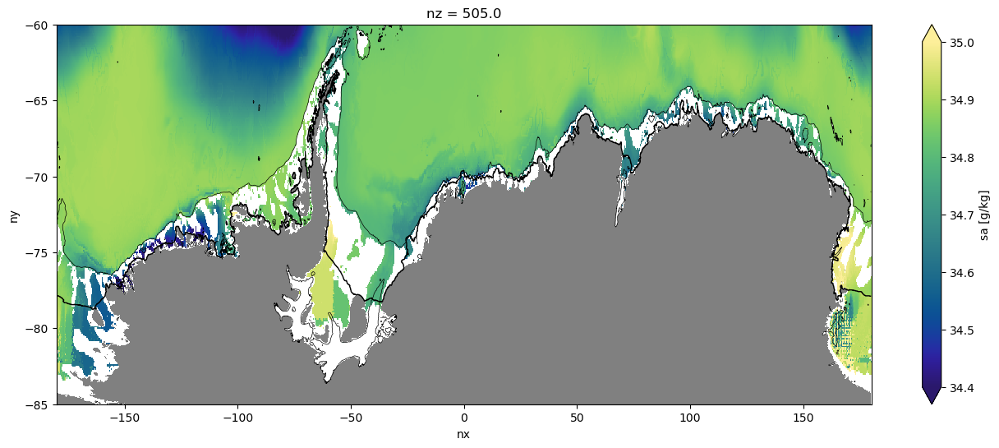

In [15]:
shenjie_salt = shenjie_data.sa
    
plt.figure(figsize=(16,6))
shenjie_salt.sel(nz=500,method='nearest').plot(vmin=34.4, vmax=35, cmap=cmocean.haline)
plt.ylim(-85,-60)

# plot model land/isobath etc:
plt.contour(topog_wrapped.lon, topog_wrapped.lat, topog_seaice_wrapped.depth, levels=[0], colors='k',linewidths=1)
plt.contour(topog_wrapped.lon, topog_wrapped.lat, topog_wrapped.depth, levels=[1000], colors='k',linewidths=0.5)
plt.pcolormesh(topog_wrapped.lon,topog_wrapped.lat,land_mask_wrapped,cmap=solid_grey_cmap)

## Si/Moorman et al. initial conditions for comparison:

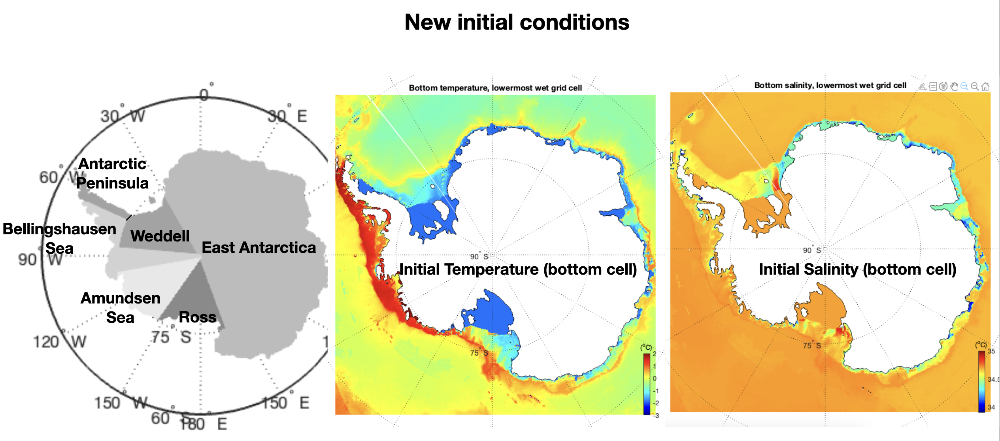